In [1]:
!python3 --version
import tensorflow as tf
print("Tensorflow", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
import warnings
warnings.filterwarnings('ignore')
import os
import sys
import json
import datetime
import numpy as np
import skimage
import skimage.draw
import cv2
import random
import math
import re
import time
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
import tifffile as tiff

from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
from mrcnn.visualize import display_instances
import mrcnn.model as modellib
from mrcnn.model import log
from mrcnn.config import Config
from mrcnn import model as modellib, utils
from custom_multi import nms_suppression_multi
from custom_multi import CustomConfig as CustomConfigMulti
from custom_multi import CustomDataset as CustomDatasetMulti
from custom import CustomConfig, CustomDataset


Python 3.9.18


Tensorflow 2.15.0
Num GPUs Available:  0


In [2]:
# Creates a session with device placement logs
sess = tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(log_device_placement=True))
print(sess)

Device mapping: no known devices.


## Parameters

In [11]:
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0
gpu_count_macro = 1
num_img_per_gpu_macro = 1
min_confidence_macro = 0.7
nms_threshold_macro = 0.3
nms_multiclass_macro = 0.3
gpu_count_micro = 1
num_img_per_gpu_micro = 1
min_confidence_micro = 0.7
nms_threshold_micro = 0.3
#MACRO_MODEL_SUBPATH = 'multicell20240319T2245/mask_rcnn_multicell_0050.h5'
#MICRO_MODEL_SUBPATH = 'cell20240302T1503/mask_rcnn_cell_0050.h5'
MACRO_MODEL_SUBPATH = 'grayscaleMulti/mask_rcnn_multicell_0050.h5'
MICRO_MODEL_SUBPATH = 'RGBsingleBest/mask_rcnn_cell_0050.h5'
RESULTS_NAME = 'test_meeting'
TEST_DIR = '/Users/tom/Desktop/Stanford/RA/OligodendroSight/OL_mrcnn/data/test/imgsnorm'
VISUALIZE = True
GRAYSCALE = True

In [4]:
ROOT_DIR = os.getcwd()
sys.path.append(ROOT_DIR)
COCO_WEIGHTS_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
DEFAULT_LOGS_DIR = os.path.join(ROOT_DIR, "logs")
RESULTS_DIR = os.path.join(ROOT_DIR, "results", RESULTS_NAME)
os.makedirs(RESULTS_DIR, exist_ok=True)

## Classification and cropping

In [5]:
class InferenceConfigMulti(CustomConfigMulti):
    GPU_COUNT = gpu_count_macro
    IMAGES_PER_GPU = num_img_per_gpu_macro
    DETECTION_MIN_CONFIDENCE = min_confidence_macro #Minimum probability value to accept a detected instance
    DETECTION_NMS_THRESHOLD = nms_threshold_macro # Non-maximum suppression threshold for detection

inference_config_multi = InferenceConfigMulti()

macro_model = modellib.MaskRCNN(mode="inference",
                            config=inference_config_multi,
                            model_dir=DEFAULT_LOGS_DIR)

macro_model_path = os.path.join(DEFAULT_LOGS_DIR, MACRO_MODEL_SUBPATH)
print("Loading macro weights from ", macro_model_path)
#model.load_weights(model_path, by_name=True) #deprecated on Python 3.9
tf.keras.Model.load_weights(macro_model.keras_model, macro_model_path , by_name=True, skip_mismatch=True)


Instructions for updating:
Use fn_output_signature instead
Loading macro weights from  /Users/tom/Desktop/Stanford/RA/OligodendroSight/OL_mrcnn/logs/grayscaleMulti/mask_rcnn_multicell_0050.h5


2024-06-03 13:35:44.279423: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:388] MLIR V1 optimization pass is not enabled
2024-06-03 13:35:44.687618: W tensorflow/c/c_api.cc:305] Operation '{name:'bn5b_branch2c/gamma/Assign' id:5225 op device:{requested: '', assigned: ''} def:{{{node bn5b_branch2c/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bn5b_branch2c/gamma, bn5b_branch2c/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


In [6]:
# Validation dataset to get the names of the classes
dataset_val = CustomDatasetMulti()
dataset_val.load_custom(os.path.join(ROOT_DIR,'data'), "valid")
dataset_val.prepare()

2024-06-03 13:35:48.368276: W tensorflow/c/c_api.cc:305] Operation '{name:'mrcnn_detection/Reshape_1' id:6831 op device:{requested: '', assigned: ''} def:{{{node mrcnn_detection/Reshape_1}} = Reshape[T=DT_FLOAT, Tshape=DT_INT32, _has_manual_control_dependencies=true](mrcnn_detection/packed, mrcnn_detection/Reshape_1/shape)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
W0000 00:00:1717446948.915150       1 op_level_cost_estimator.cc:699] Error in PredictCost() for the op: op: "CropAndResize" attr { key: "T" value { type: DT_FLOAT } } attr { key: "extrapolation_value" value { f: 0 } } attr { key: "method" value { s: "bilinear" } } inputs { dtype: DT_FLOAT shape { dim { size: -48 } dim { size: -308 } dim { size: -309 } dim { size: 256 } } } inputs { dtype: DT_FLOAT shape { dim { size: -19 } dim { size: 4 } } } inputs { dtype

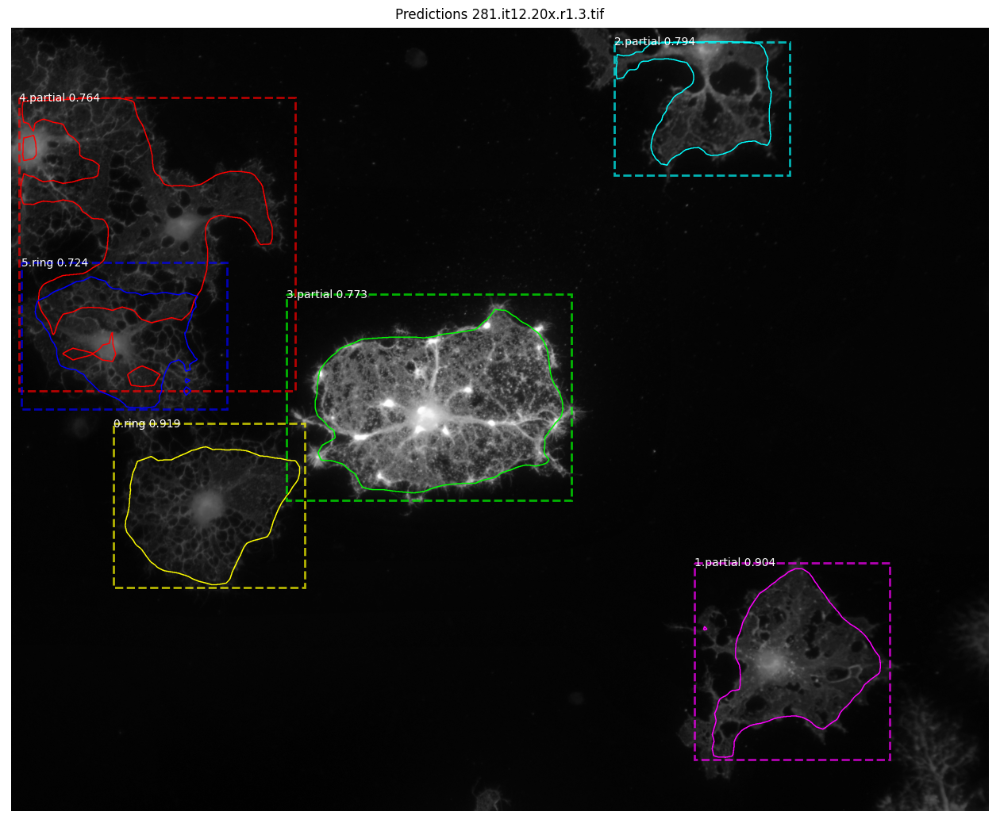

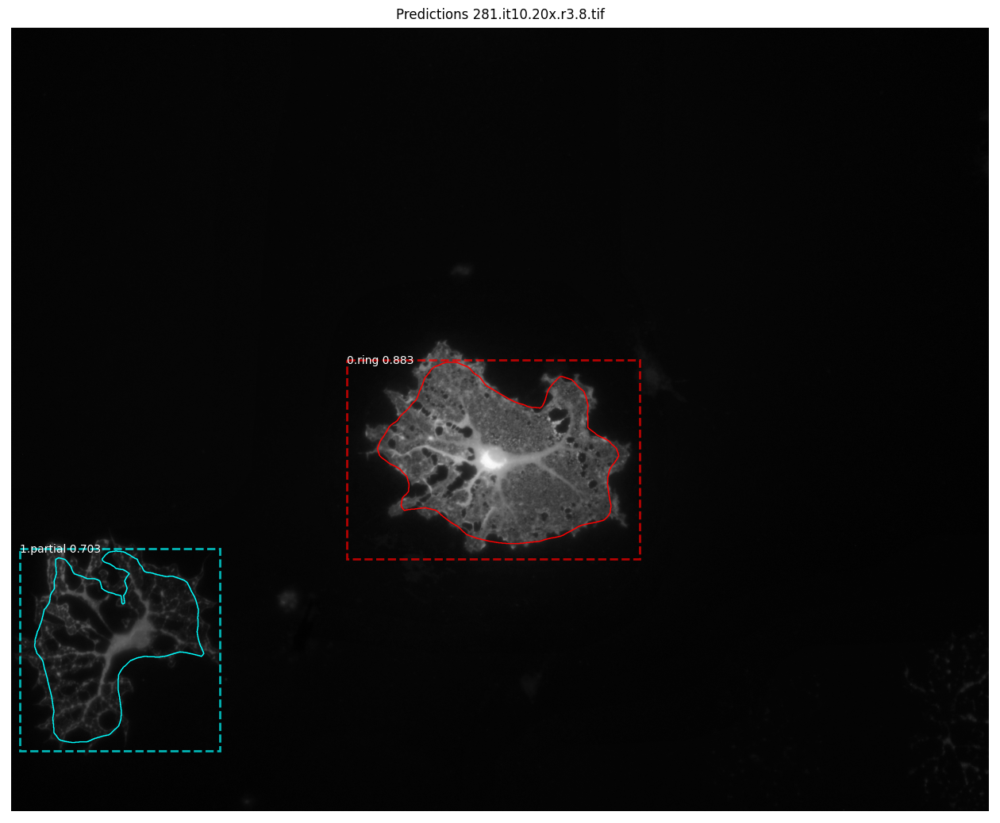

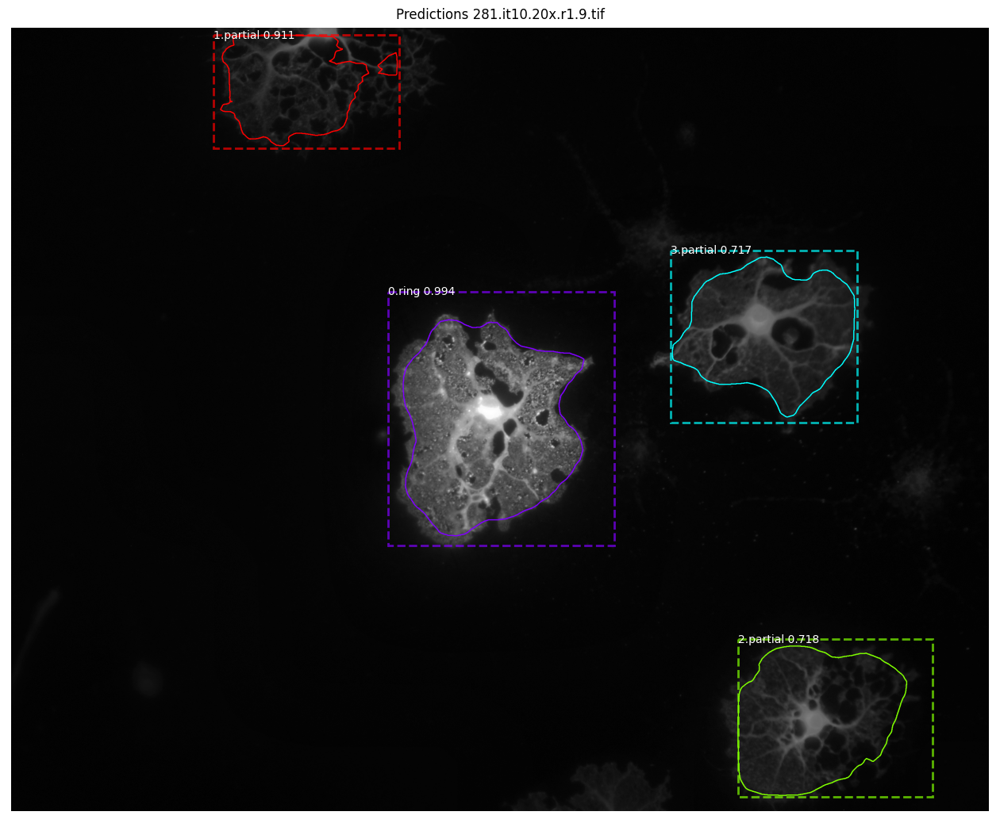

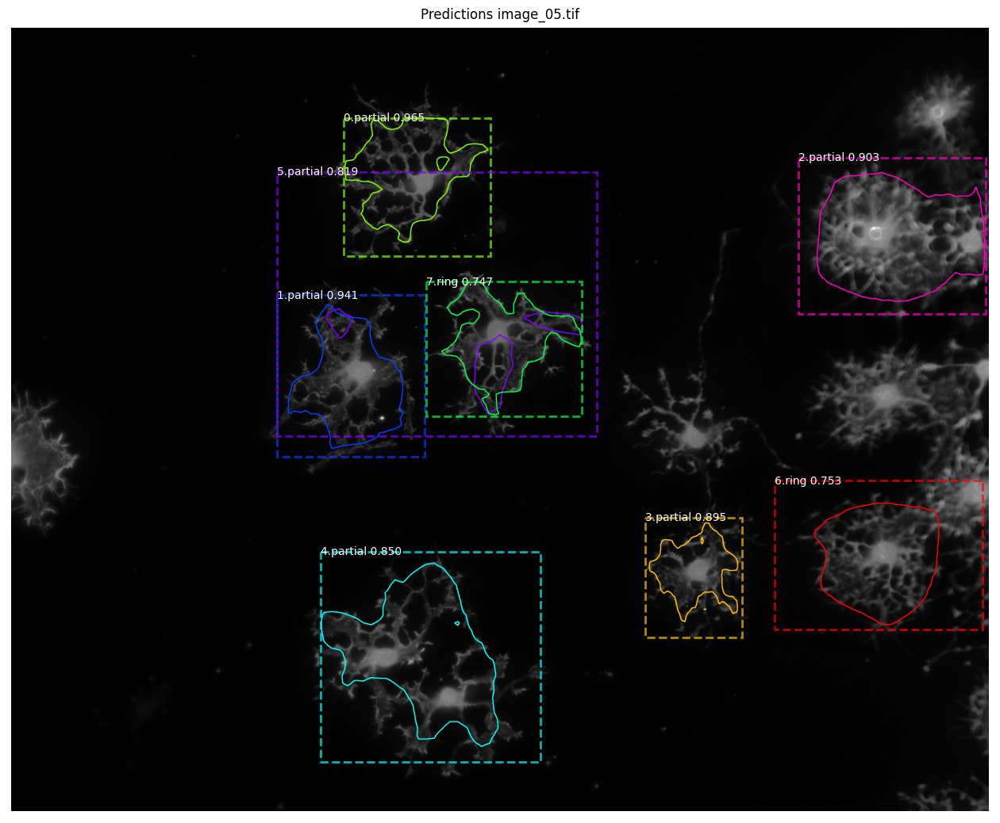

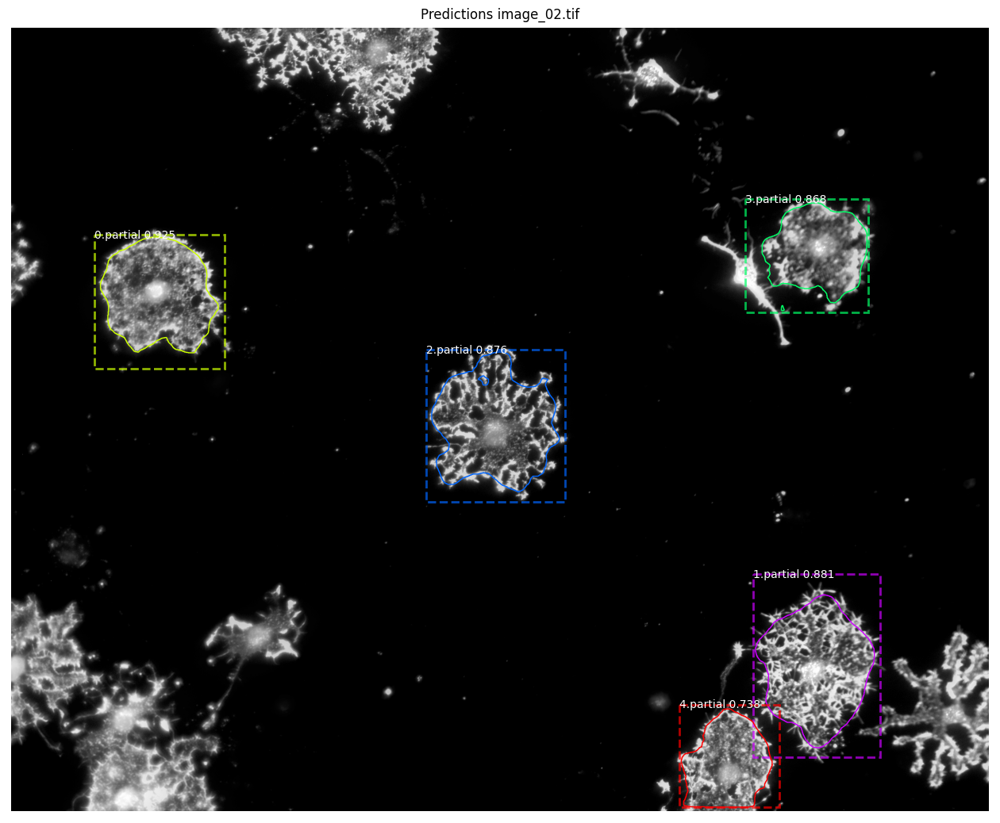

...

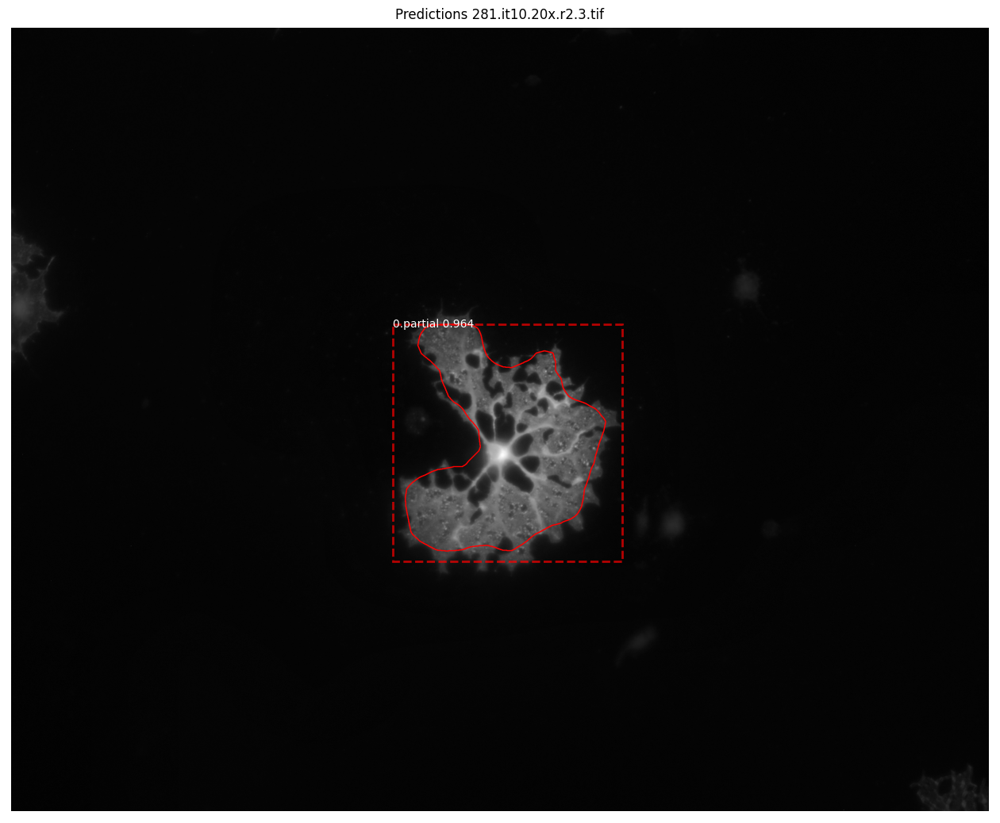

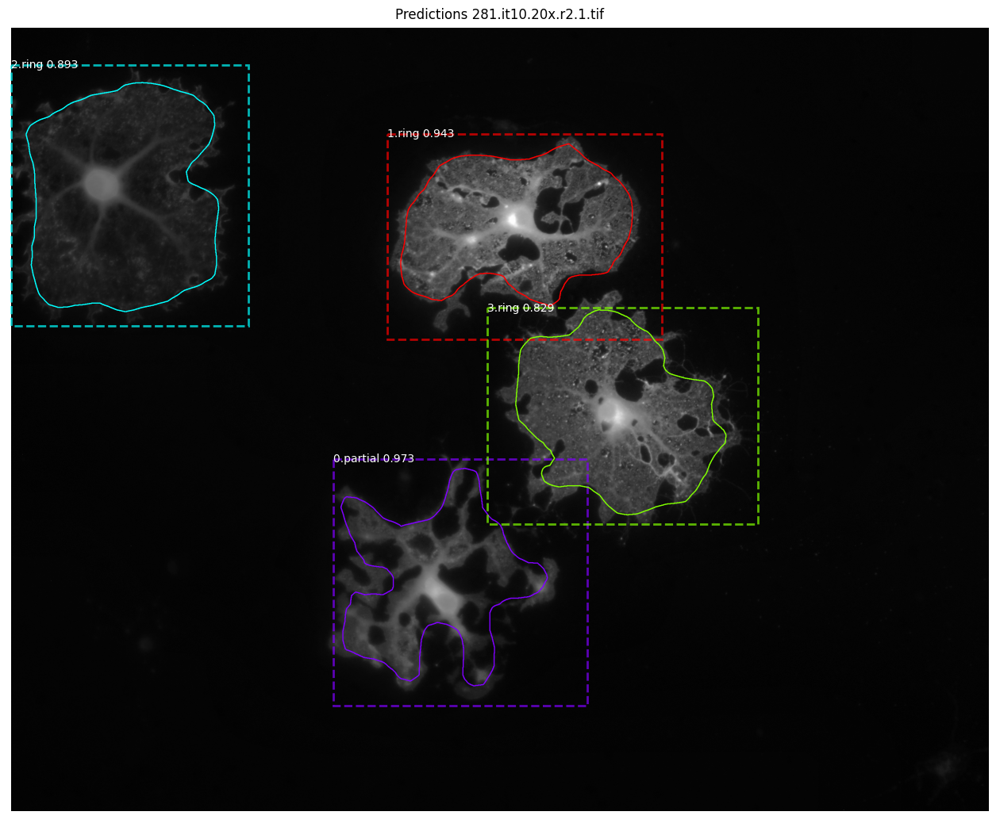

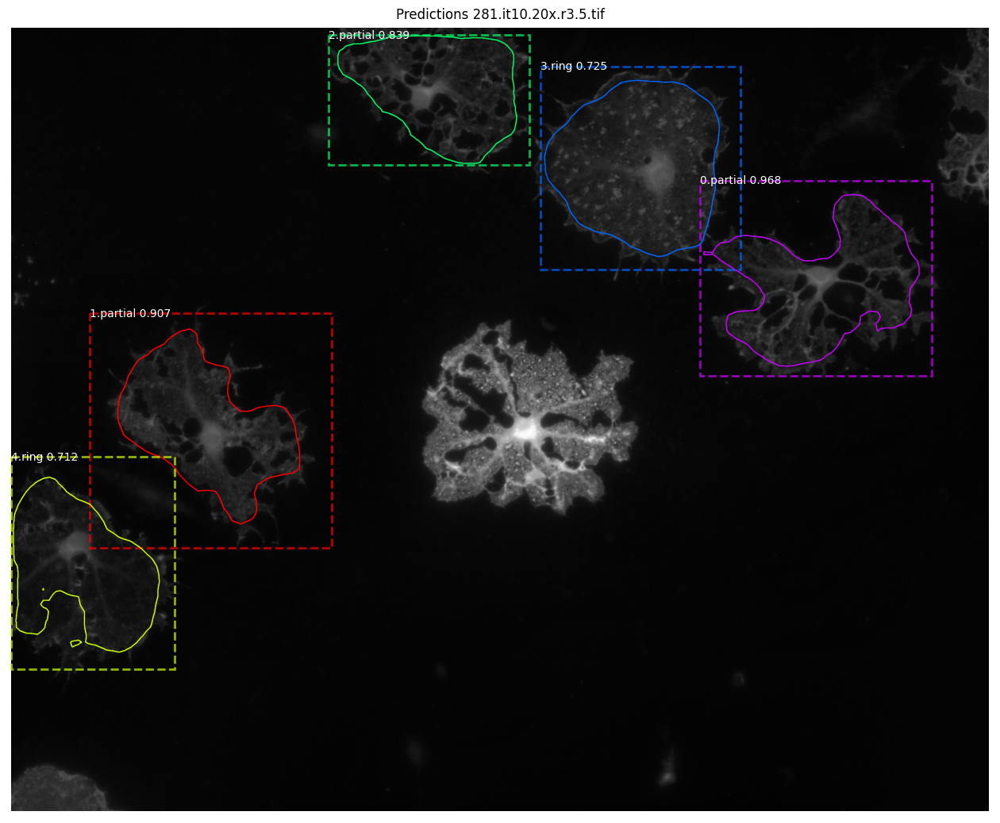

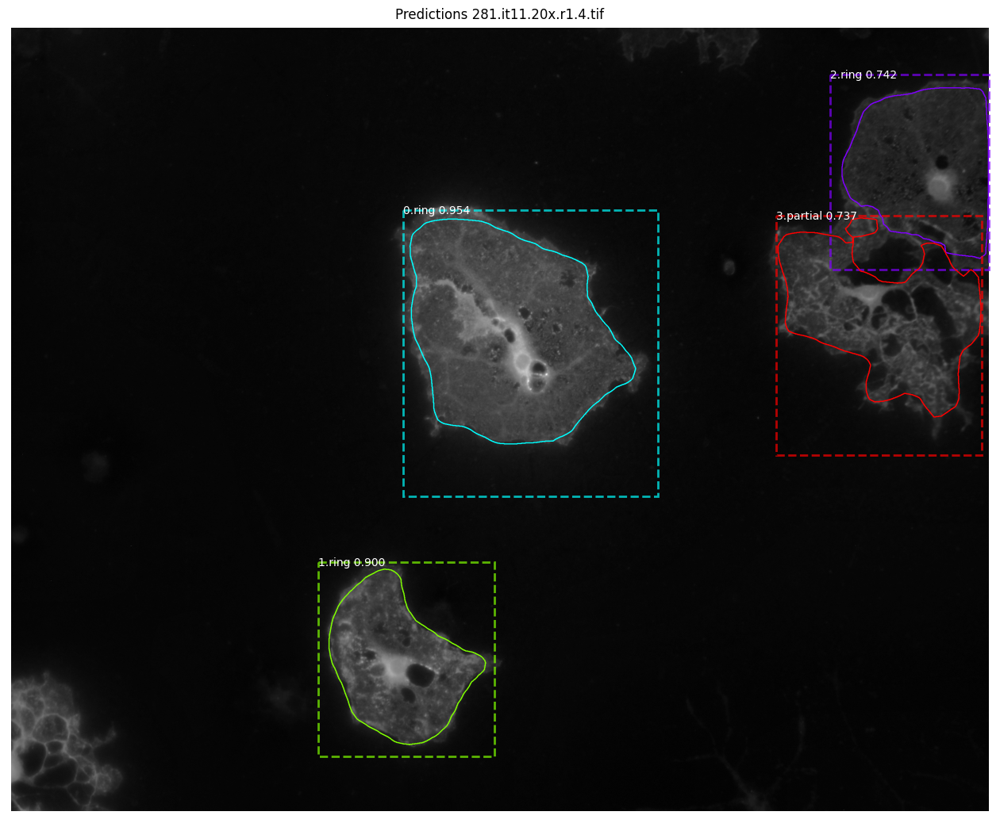

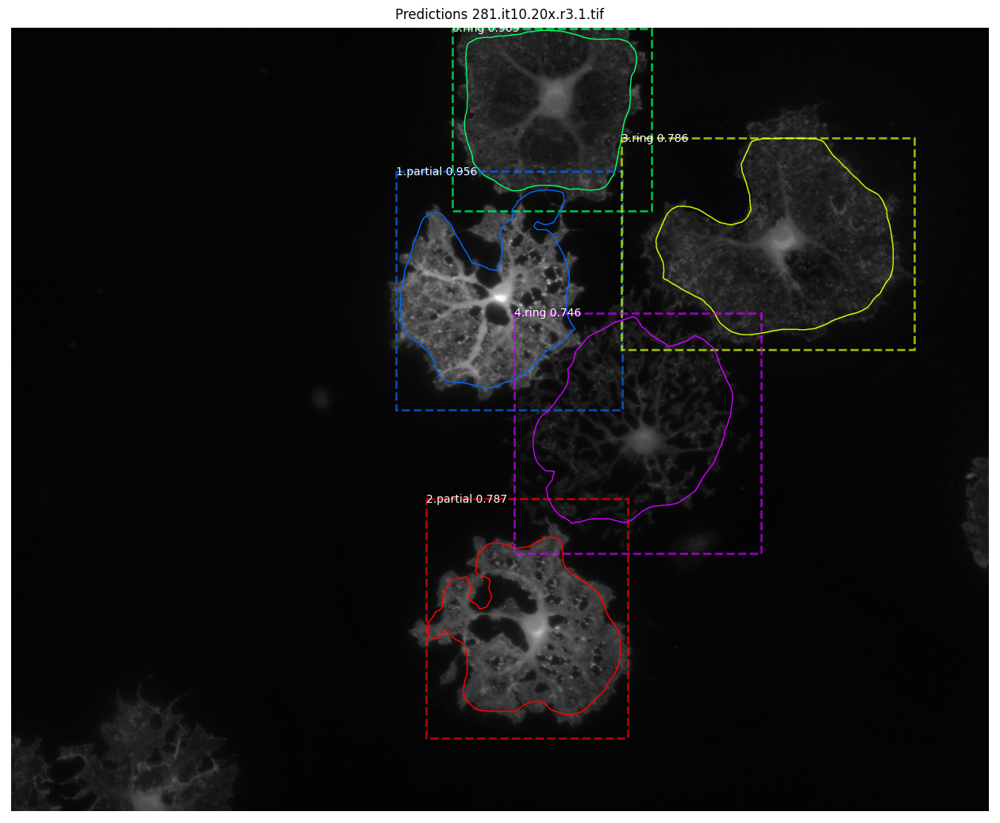

In [7]:
image_paths = []
for filename in os.listdir(TEST_DIR):
    if filename.endswith(".tif"):
        image_paths.append(os.path.join(TEST_DIR, filename))

res_list = []
for image_path in image_paths:
    if GRAYSCALE:
        gray_image = skimage.io.imread(image_path, as_gray=True)
        gray_image = (gray_image * 255).astype(np.uint8)
        image = np.stack((gray_image,)*3, axis=-1)
    else:
        image = skimage.io.imread(image_path)
    macro_results = macro_model.detect([image], verbose=0)
    macro_results = nms_suppression_multi(macro_results, nms_multiclass_macro)
    r = macro_results[0]
    if VISUALIZE:
        display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                          dataset_val.class_names, r['scores'], 
                          title=f"Predictions {os.path.basename(image_path)}",
                          show_mask = False)
    img_res_dir = os.path.join(RESULTS_DIR, os.path.basename(image_path)[:-4])
    os.makedirs(img_res_dir, exist_ok=True)
    for i in range(r['masks'].shape[2]):
        class_name = dataset_val.class_names[r['class_ids'][i]]
        res_list.append([os.path.basename(image_path), i, dataset_val.class_names[r['class_ids'][i]], r['scores'][i], r['rois'][i]])
        cropped_img = image[r['rois'][i][0]:r['rois'][i][2], r['rois'][i][1]:r['rois'][i][3]]
        cv2.imwrite(os.path.join(img_res_dir, f'{i:04d}_' + class_name + '.tif'), cropped_img)
    

res_df = pd.DataFrame(res_list, columns=['image_name', 'detection_id', 'class', 'score', 'bbox'])
res_df.to_csv(os.path.join(RESULTS_DIR, 'results.csv'), index=False)

## Segmentation

In [13]:
class InferenceConfigSingle(CustomConfig):
    GPU_COUNT = gpu_count_micro
    IMAGES_PER_GPU = num_img_per_gpu_micro
    DETECTION_MIN_CONFIDENCE = min_confidence_micro #Minimum probability value to accept a detected instance
    DETECTION_NMS_THRESHOLD = nms_threshold_micro # Non-maximum suppression threshold for detection

inference_config_single = InferenceConfigSingle()

micro_model = modellib.MaskRCNN(mode="inference",
                            config=inference_config_single,
                            model_dir=DEFAULT_LOGS_DIR)

micro_model_path = os.path.join(DEFAULT_LOGS_DIR, MICRO_MODEL_SUBPATH)

print("Loading micro weights from ", micro_model_path)
tf.keras.Model.load_weights(micro_model.keras_model, micro_model_path , by_name=True, skip_mismatch=True)

Loading micro weights from  /Users/tom/Desktop/Stanford/RA/OligodendroSight/OL_mrcnn/logs/RGBsingleBest/mask_rcnn_cell_0050.h5


2024-06-03 13:43:12.105718: W tensorflow/c/c_api.cc:305] Operation '{name:'bn4f_branch2c_2/moving_mean/Assign' id:22347 op device:{requested: '', assigned: ''} def:{{{node bn4f_branch2c_2/moving_mean/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bn4f_branch2c_2/moving_mean, bn4f_branch2c_2/moving_mean/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Processing 1 images
image                    shape: (463, 539, 3)         min:    1.00000  max:  115.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:    7.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


2024-06-03 13:43:17.110383: W tensorflow/c/c_api.cc:305] Operation '{name:'mrcnn_detection_2/Reshape_1' id:26999 op device:{requested: '', assigned: ''} def:{{{node mrcnn_detection_2/Reshape_1}} = Reshape[T=DT_FLOAT, Tshape=DT_INT32, _has_manual_control_dependencies=true](mrcnn_detection_2/packed, mrcnn_detection_2/Reshape_1/shape)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
W0000 00:00:1717447398.124542       1 op_level_cost_estimator.cc:699] Error in PredictCost() for the op: op: "CropAndResize" attr { key: "T" value { type: DT_FLOAT } } attr { key: "extrapolation_value" value { f: 0 } } attr { key: "method" value { s: "bilinear" } } inputs { dtype: DT_FLOAT shape { dim { size: -48 } dim { size: -308 } dim { size: -309 } dim { size: 256 } } } inputs { dtype: DT_FLOAT shape { dim { size: -19 } dim { size: 4 } } } input

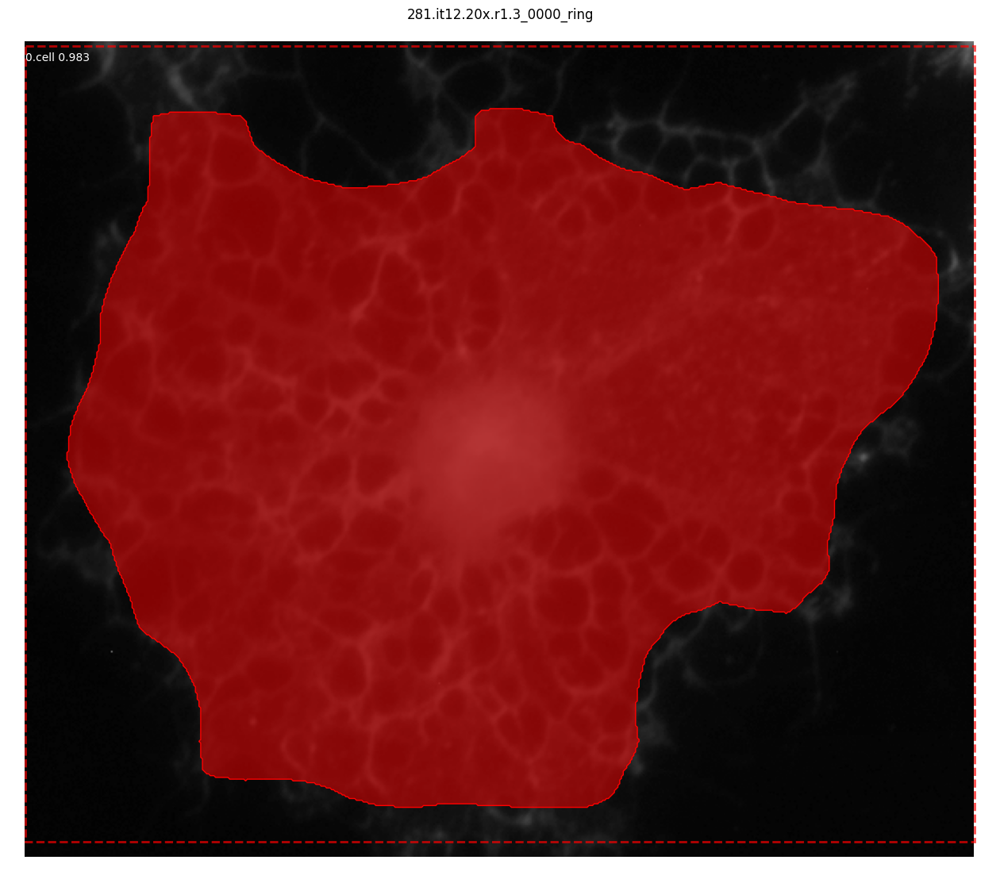

Processing 1 images
image                    shape: (555, 550, 3)         min:    0.00000  max:  143.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:   38.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


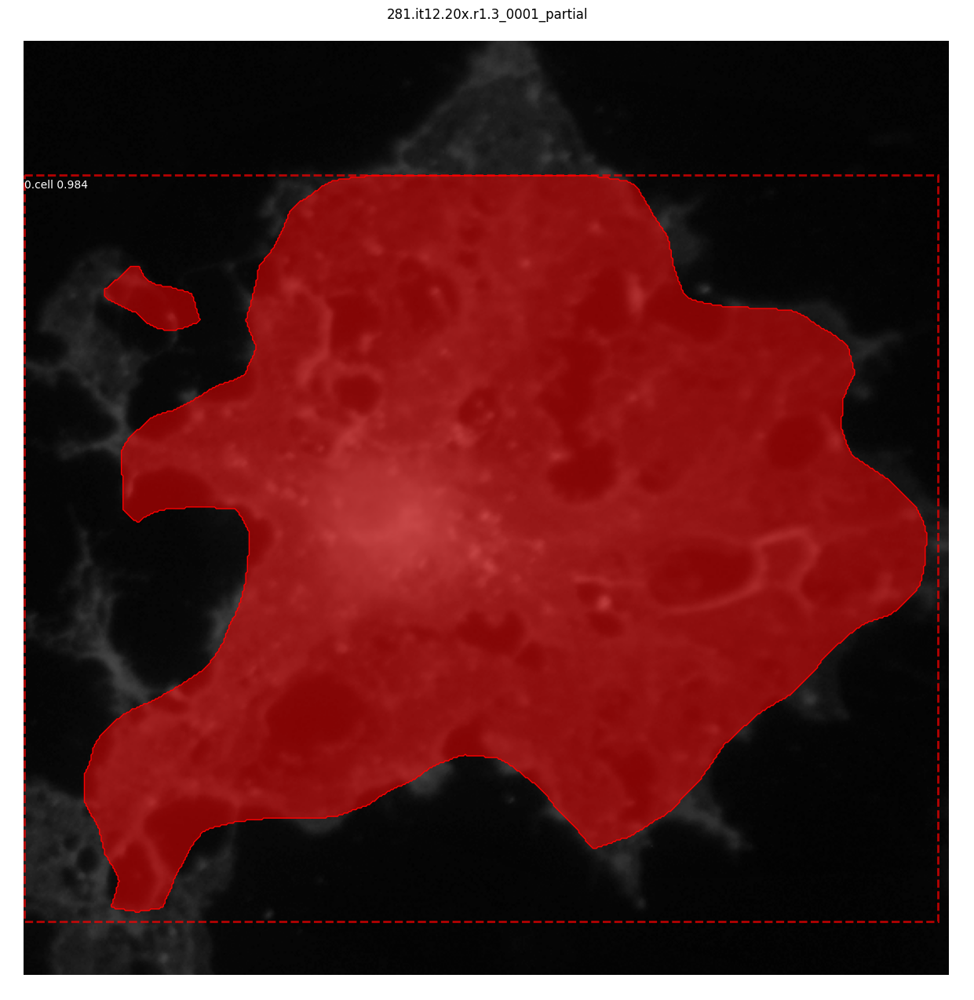

Processing 1 images
image                    shape: (377, 493, 3)         min:    1.00000  max:  169.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:   64.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


KeyboardInterrupt: 

In [14]:
for i in range(len(res_df)):
    img_path = os.path.join(RESULTS_DIR, res_df.iloc[i]['image_name'][:-4], f"{res_df.iloc[i]['detection_id']:04d}_" + res_df.iloc[i]['class'] + '.tif')
    if GRAYSCALE:
        gray_image = skimage.io.imread(img_path, as_gray=True)
        gray_image = (gray_image * 255).astype(np.uint8)
        image = np.stack((gray_image,)*3, axis=-1)
    else:
        image = skimage.io.imread(img_path)
    img = image
    micro_results = micro_model.detect([img], verbose=1)
    r = micro_results[0]
    if VISUALIZE:
        display_instances(img, r['rois'], r['masks'], r['class_ids'], 
                          ['BG', 'cell'], r['scores'], 
                          title=f"{res_df.iloc[i]['image_name'][:-4]}_{i:04d}_{res_df.iloc[i]['class']}")
    mask = (r['masks'][:,:,0]*255).astype(np.uint8)
    cv2.imwrite(os.path.join(RESULTS_DIR, res_df.iloc[i]['image_name'][:-4], f'{i:04d}_' + res_df.iloc[i]['class'] + '_mask.tif'), mask)